# Лабораторная работа #3

## Цель работы 

Знакомство и освоение работы с моделью машинного обучения типа многослойный перцептрон для решения задачи регрессии с использованием библиотеки Tensorflow.

## Ход работы 

1. Разобрать этапы базового примера - Проверки работы нейросети

2. Загрузка данных

  1) Выполнить загрузку файла с подготовленным набором данных (отчищенный от пропусков и выбросов для целевой и независимых переменных) в таблицу _df_

  2) Объявить список независимых и целевой переменных

  3) Оставить в таблице данных _df_ столбцы, относящиеся только к списку независимых и целевой переменных



2. Выполнить процедуру НОРМАЛИЗАЦИИ данных и сохранить в отдельную таблицу

  1) Отделить X от Y исходной таблицы и сформировать новые dfX и dfY

  2) Используя класс MinMaxScaler получить нормализованые версии dfX и dfY и сохранить их в dfXNorm и dfYNorm соответственно

  2) Для X и Y построить гистограммы распределения нормализованных и исходных значений 
  

3. Сформировать обучающую и проверочную части:

  1) На основе нормализированой выборки сформировать _xNorm__train_ , _xNorm__test_ , _yNorm__train_ , _yNorm__test_


4. Определить структуру четырех моделей (кол-во узлов на входных, выходных и скрытых слоях).
```
m1 - два вход -> один выход (2->1)
m2 - два входа -> скрытые слои -> один выход (пример 2->...->...->1)
m3 - несколько входов -> один выход (пример 5->1)
m4 - несколько входов -> скрытые слои -> один выход (пример 5->...->...->1)
```
 
5. Для каждой модели (m1, m2, m3, m4) нейронной сети:

  1) Провести процедуру обучения сети, во время которой фиксировать значения оценок потерь
    
  2) Получить значения целевой переменной "yNorm" на проверочном(TEST) наборе
    
  3) Получить значения метрик точности на проверочном(TEST) наборе: R2(коэфф. детерминации) и RMSE (среднеквадратичное отклонение) 
    
  4) Построить диаграмму рассеяния вычисленных значений Y_pred от проверочных значений Y_test
    
  5) Построить гистограмму остатков (разностей между Y_pred и Y_test)

  6) Для моделей m1 и m2: 
      * Построить 3d график зависимости вычисленных значений Y_pred от объясняющих признаков x1 и x2
    
  8) Для модели m1 и m3:
      * Получить весовые коэфф. w и bias
         
6. Составить сводную таблицу и провести сравнение точности полученых моделей в зависимости от структуры модели

7. Сделать выводы о влиянии структуры на точность и эффектовности применения нейронных сетей на вашем наборе данных 



1. Список выбранных целевой переменной 'y' и независимых признаков 'x1, x2, x3, ...'

2. Описание процесса загрузки и НОРМАЛИЗАЦИИ с выводом значений таблиц

3. Гистограммы распределения исходных и шкалированых значений для целевой переменной 'y' и независимых признаков 'x1, x2, x3, ...'

4. Этапы построения и оценки  точности моделей (m1, m2, m3, m4)
  
5. Сводная таблица оценок точности с указанием структуры модели

6. Выводы по результатам сравнительного анализа полученных регрессионных моделей

## Рекомендуемые материалы

- [Eng][Видео] Принцип и этапы работы нейронных сетей, URL: https://www.youtube.com/playlist?list=PLZHQObOWTQDNU6R1_67000Dx_ZCJB-3pi
- [Eng]Примеры и приемы работы с Pytorch #1, URL: https://github.com/yunjey/pytorch-tutorial
- [Eng]Примеры и приемы работы с Pytorch #2, URL: https://github.com/python-engineer/pytorchTutorial


- [Eng]Страница курса CS231n Convolutional Neural Networks for Visual Recognition:
  - Введение и архитектура, URL: https://cs231n.github.io/neural-networks-1/
  - Обработка данных, URL: https://cs231n.github.io/neural-networks-2/
- [Eng]Сравнение и обзор функций активации,  URL: https://arxiv.org/pdf/1710.05941.pdf


  
- [Ru]Открытый курс машинного обучения. Тема 4. Линейные модели классификации и регрессии, URL: https://habr.com/ru/company/ods/blog/323890/
- [Ru]Дьяконов, Линейная регрессия++, URL: https://dyakonov.org/2019/10/31/%d0%bb%d0%b8%d0%bd%d0%b5%d0%b9%d0%bd%d0%b0%d1%8f-%d1%80%d0%b5%d0%b3%d1%80%d0%b5%d1%81%d1%81%d0%b8%d1%8f/
- [Ru]Дьяконов,Метрики оценки точности, URL: https://alexanderdyakonov.files.wordpress.com/2018/10/book_08_metrics_12_blog1.pdf




# Подключение библиотек

Для выполнения работы потребуется установить библиотеки:
- tensorflow - для работы с нейронными сетями (требует 400 МБ интернет трафика) 
- plotly - для отображения 3d графиков

Команда для установки:
```
> python -m pip install --upgrade pip
> pip3   install --upgrade tensorflow plotly
```

In [1]:
import tensorflow as tf

In [2]:
# Python 3.8
import pandas as pd
import numpy  as np

from sklearn import linear_model
from sklearn import ensemble
from sklearn import metrics
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib import cm
import seaborn as sns

In [3]:
from IPython.display import clear_output

In [4]:
import plotly.graph_objects as go

In [5]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
#tf.debugging.set_log_device_placement(False)
#tf.config.set_soft_device_placement(False)

Num GPUs Available:  0


## Объявление функций

Для повышения повторяемости кода и повышения уровня читаемости объявим несколько функций с уже знакомыми операциями

In [6]:
def PLOT34(y_test, y_pred):
    '''
    Функция построения графиков
    :param y_test: - проверочные значения целевой переменный
    :param y_pred: - вычисленные значения целевой переменный
    '''
    plt.figure(figsize=(12,6))
    
    # == Диаграмма рассеяния вычисленных значений ==
    # создать первое полотно 121: 1-строк, 2-столбцов, 1-индекс текущего полотна в сетке
    plt.subplot(121)
    plt.scatter(y_test, y_pred,  alpha=0.1)
    plt.scatter(y_test, y_test,  alpha=0.1)
    plt.title('Диаграмма рассеяния вычисленных значений');
    plt.xlabel('Проверочное Y')
    plt.ylabel('Вычисленное Y')

    
    # == Диаграмма рассеяния ошибок ==
    # создать первое полотно 121: 1-строк, 2-столбцов, 2-индекс текущего полотна в сетке
    plt.subplot(122)
    plt.scatter(y_test, (y_test - y_pred)**2,  alpha=0.1)
    plt.title('Диаграмма рассеяния квадрата абсолютной ошибки')
    plt.xlabel('Проверочное Y')
    plt.ylabel('Квадрат абсолютной ошибки')
#--------------------------------------------------------------------------

In [7]:
def GET_METRICS_SINGLE(y_test, y_pred):
    '''
    Вычисление и вывод метрик: MAE, RMSE, R2.
    На основе сравнения проверочных и вычисленных.
    :param y_test: - проверочные значения целевой переменный
    :param y_pred: - вычисленные значения целевой переменный
    '''
    mae  = metrics.mean_absolute_error        (y_test, y_pred)
    mse  = metrics.mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2   = metrics.r2_score                   (y_test, y_pred)

    print ("MAE : {:>9,.3f} (средняя абсолютная ошибка)".format              ( mae ))
    print ("MSE : {:>9,.6f} (среднеквадратичная ошибка)".format( mse ))
    print ("RMSE: {:>9,.6f} (кв. корень из среднеквадратичной ошибки)".format( rmse ))
    print ("R2  : {:>9,.3f} (коэфф. детерминации)".format                    ( r2 ))
#--------------------------------------------------------------------------

In [8]:
def my3dplot (  x_train, y_train,  isDrawTrain,
                x_test, y_test,    isDrawTest,
                y_pred,            isDrawPred,
                x1Name, x2Name, y_targetName):
    """
    Отображает 3д график исходных и вычисленых точек
    
    x_test, y_test, x_train, y_train - обучающиа и проверочная чатсти исходной таблицы  (тип DataFrame)
    y_pred, - вычисленные значения (тип DataFrame)
    x1Name, x2Name - имя столбца для x1 и x2 (тип стрококвый)
    y_targetName   - имя столбца целевого    (тип стрококвый)
    
    """
    sTransparencyVal  = 0.9 # Прозрачность поверхности вычисленных значений y_pred
    mTransparencyVal  = 0.3 # Прозрачность точек графика train, test
    mSize = 5   # Размер точки

    # Построить поверхность соотвествующую вычисленным значениям
    trace_LinModel = go.Mesh3d(
                       x= x_test[ x1Name ].values,
                       y= x_test[ x2Name ].values,
                       z= y_pred.reshape(-1), # <-- Вычисленные
                       name="Вычисленный",
                       opacity=sTransparencyVal,
                       #alphahull=1,
                       color='rgba(100,244,100,0.6)',
                      )
    
    # Построить рассеяние обучающих точек 
    trace_Train = go.Scatter3d (x= x_train[ x1Name ].values, # <-- Обучающие
                                y= x_train[ x2Name ].values, # <-- Обучающие
                                z= y_train[ y_targetName ].values,     # <-- Обучающие
                                name="Обучающие",
                                mode='markers',
                                marker=dict(
                                   size=mSize,
                                   color=y_train[ y_targetName ].values, # Источник значений цвета <-- Обучающие
                                   colorscale='Blues',        # Название цветовой шкалы # _r
                                   opacity=mTransparencyVal
                                ))
    
    # Построить рассеяние проверочных точек 
    trace_Test = go.Scatter3d (x= x_test[ x1Name ].values,# <-- Проверочные
                               y= x_test[ x2Name ].values,# <-- Проверочные
                               z= y_test[ y_targetName ].values,    # <-- Проверочные
                               name="Проверочные",
                               mode='markers',
                               marker=dict(
                                  size=mSize,
                                  color=y_test[y_targetName].values, # Источник значений цвета <-- Проверочные
                                  colorscale='Reds',        # Название цветовой шкалы # _r
                                  opacity=mTransparencyVal
                               ))

    # Составить список элементов к отрисовке на графике
    ListForDraw = []
    if isDrawTrain: ListForDraw.append(trace_Train)
    if isDrawTest:  ListForDraw.append(trace_Test)
    if isDrawPred:  ListForDraw.append(trace_LinModel)

    # Отрисовать все указанные элементы
    fig = go.Figure( data=ListForDraw)

    # Добавить подписи осей
    fig.update_layout(
        title='Завиcимость {} от ({}, {})'.format(y_targetName, x1Name, x2Name), 
        scene=dict(
            xaxis_title=x1Name,
            yaxis_title=x2Name,
            zaxis_title=y_targetName,
        ),
    )
    fig.show()
#--------------------------------------------------------------------------

# Tensorflow. Проверка работы нейросети на искусственных данных

Для последующего сравнения получим модель нейронной сети на "идеальных" входных данных, т.е. с четко прослеживаемой зависимостью переменных и контролируемым уровнем шумов. 

Цель данного шага - продемонстрировать работоспособность данного подхода.

## Набор данных для демонстрации

Создадим искусственный набор данных c ЕДИНСТВЕННЫЕМИ "x" и "y". 
После создания преобразуем данные к типу pandas.DataFrame, т.к. загруженные данные по варианту будут иметь указаный тип.

In [9]:
transparencyVal = 0.3  # Прозрачность точек графика
markerSize = 10        # Размер точки

N = 1000 # кол-во точек X
noiseLevel= 0.05 # степень зашумленности
X = np.linspace(-1., 1., N).reshape(-1, 1) # привести массив к столбчатой структуре
Y_noise = np.random.normal(-noiseLevel,noiseLevel,N).reshape(-1, 1)

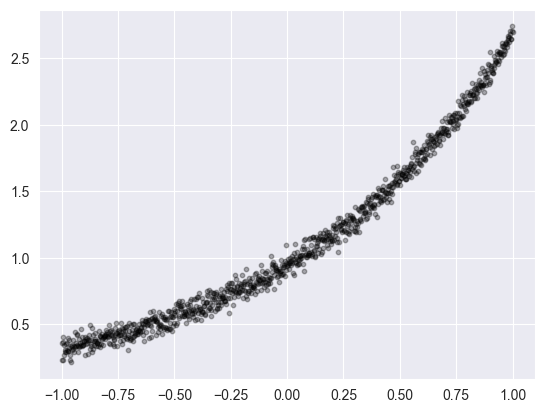

In [10]:
# Экспонента
Y_exp = np.exp(X).reshape(-1, 1) # привести массив к столбчатой структуре
Y_exp= Y_exp+Y_noise
plt.scatter(X, Y_exp, s=markerSize, color="black", alpha=transparencyVal)

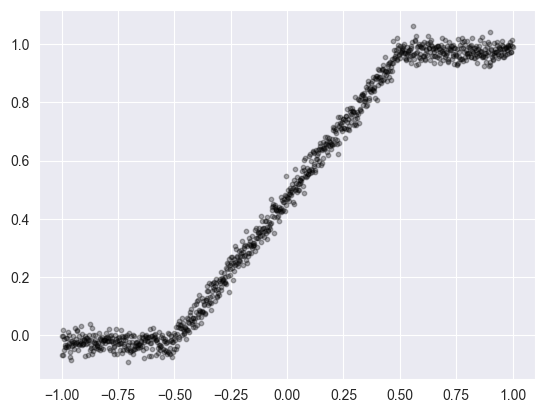

In [11]:
# Линейный с граничными значениями
Y_linstep = np.concatenate([  
        np.zeros( int(X.size * 0.25) ), 
        np.linspace(0., 1., int(X.size * 0.5) ), 
        1. + np.zeros(int(X.size * 0.25) )
        ], 
    ).reshape(-1, 1)# привести массив к столбчатой структуре

Y_linstep= Y_linstep+Y_noise/2
plt.scatter(X, Y_linstep, s=markerSize, color="black", alpha=transparencyVal)

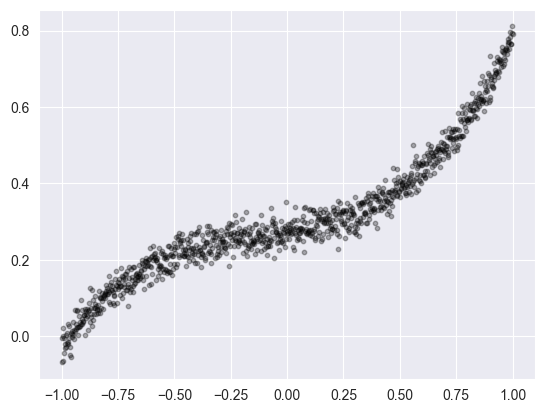

In [12]:
# Полином
Y_polyn = (0.3*(X**3) + 0.1*(X**2) + 0.1 * X + 0.3).reshape(-1, 1) # привести массив к столбчатой структуре
Y_polyn = Y_polyn + Y_noise/2
plt.scatter(X, Y_polyn, s=markerSize, color="black", alpha=transparencyVal)

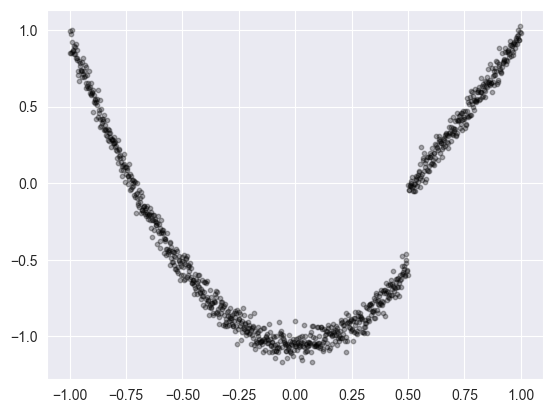

In [13]:
# Парабола
f1 = lambda x: ((x < .5) * np.power(x, 2) + (x > .5) * x) * 2 -1
Y_parabola = f1(X).reshape(-1, 1) # привести массив к столбчатой структуре
Y_parabola = Y_parabola + Y_noise
plt.scatter(X, Y_parabola, s=markerSize, color="black", alpha=transparencyVal)

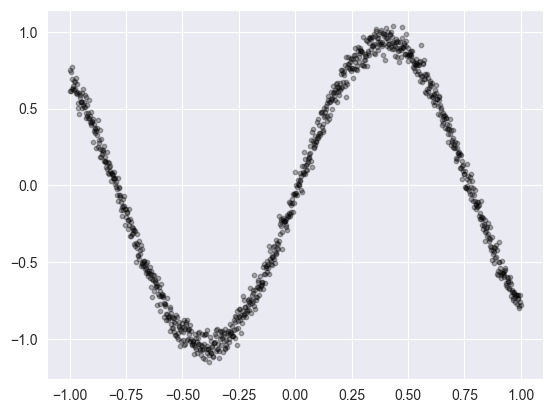

In [14]:
# Синусоида
Y_sin = np.sin(4 * X).reshape(-1, 1) # привести массив к столбчатой структуре
Y_sin= Y_sin+Y_noise
plt.scatter(X, Y_sin, s=markerSize, color="black", alpha=transparencyVal)

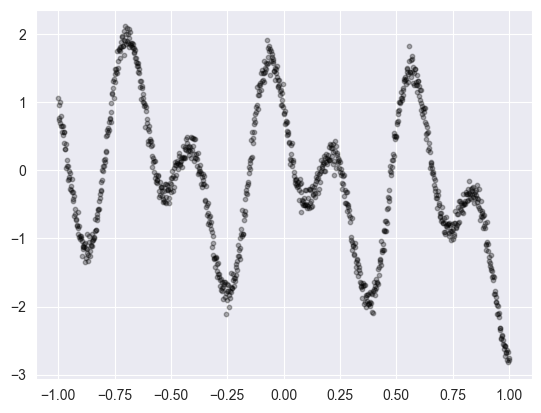

In [15]:
# Наложение циклических
Y_hard = np.cos(X*10)  - 1*np.sin(20*X) - 1*X**3
Y_hard= Y_hard+Y_noise*2
plt.scatter(X, Y_hard, s=markerSize, color="black", alpha=transparencyVal)

Выберем один из наборов данных для демонстрации

In [16]:
x_train = X.copy().reshape(-1,1)    # привести массив к столбчатой структуре
#▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼
y_train = Y_parabola.copy().reshape(-1,1) # привести массив к столбчатой структуре
#▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲

Нормализуем исходные данные для приведения всех значений к единой шкале

Text(0.5, 0, 'Объясняющий X')

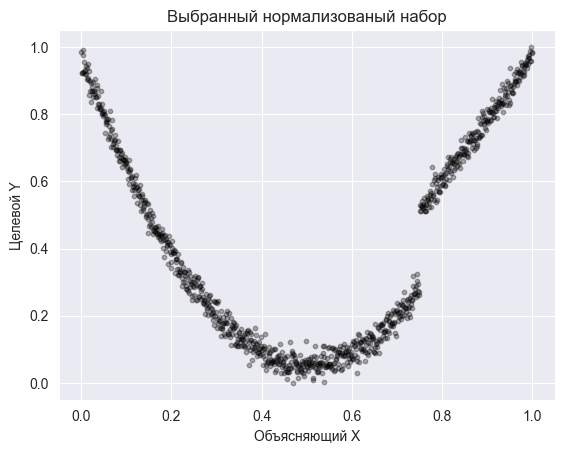

In [17]:
NormalizerX_EXAMPLE = MinMaxScaler().fit(x_train) 
NormalizerY_EXAMPLE = MinMaxScaler().fit(y_train)  
xNorm_train = NormalizerX_EXAMPLE.transform(x_train)
yNorm_train = NormalizerY_EXAMPLE.transform(y_train)

plt.scatter(xNorm_train, yNorm_train, s=markerSize, color="black", alpha=transparencyVal)
plt.title("Выбранный нормализованый набор")
plt.ylabel("Целевой Y")
plt.xlabel("Объясняющий X")

## Структура и параметры

Основным элементом искусственной нейронной сети (ИНС) является формальный нейрон Нейрона формирует выходной сигнал "y" в зависимости от входных сигналов x0,…,xN. Значения входных сигналов могут усиливаться или ослабляться зависимости от величины и знака весовых (передаточных) коэфф. синапсов w0,…,wN.
Взвешенные сигналы суммируются и могут поступать на вход некоторой функции преобразователя - функции активации, которая может иметь линейный, либо разнообразный нелинейный вид. 


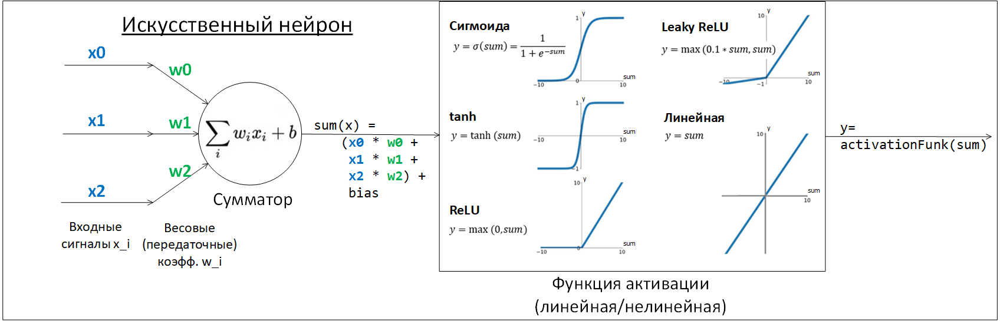

Для решения задачи восстановления числовой зависимости (регрессии) будем использовать ИНС со структурой многослойный перцептрон. В такой структуре сигналы распространяются от входов к выходам и нейроны сгруппированы в слои. При этом соседние слои являются полносвязными, т.е. каждый нейрон из слоя-источника передает сигналы в каждый нейрон-слоя приемника.

Используя таблицу с образцами (определяющие x и зависимый от них y), есть возможность сравнить вычисленные значения y_pred и ожидаемые (проверочные) y_test. Ошибки (разности) между вычисленными и ожидаемыми значениями передают в функцию оценки потеть (loss function) - функцию тем или иным способом вычисляющую единый коэфф. несоответствия.

Используя текущие значения потерь (loss) выбранная функция оптимизации  вычислит поправки к текущим весовым коэфф. w0,…,wN и применит их. Поправки вычисляются таким образом, чтобы минимизировать значения потерь (loss). 

В целом при подходе "обучение с учителем" нейронная сеть итеративно подбирает комбинацию весовых коэфф. такую, чтобы вычисленные ответы были как можно точнее в сравнении с обучающими образцами.

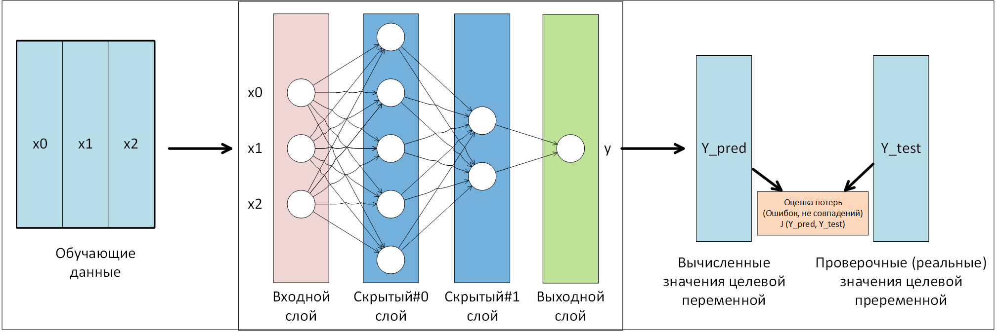

Для создания модели необходимо выбрать следующие параметры:
* Кол-во эпох - повторений для подбора коэфф. нейронов

* Структуру нейронной сети:
  - кол-во входных нейронов = кол-ву "x"
  - кол-во скрытых слоев и нейронов на каждом из них
  - кол-во выходных нейронов = кол-ву "y"

* Нелинейные функции активации для скрытых слоев, при их наличии:

    Некоторые доступные функции активации нейронов:
    - relu(...): Applies the rectified linear unit activation function.
    - elu(...): Exponential Linear Unit.
    - sigmoid(...): Sigmoid activation function, sigmoid(x) = 1 / (1 + exp(-x)).
    - tanh(...): Hyperbolic tangent activation function.
    - linear(...): Linear activation function (pass-through).

    Полный список функций активации смотрите на странице справке https://www.tensorflow.org/api_docs/python/tf/keras/activations


* Функцию оценки потерь (спобоб оценки ошибок между y_pred и y) = Среднеквадратичная ошибка (MSE)

    Доступные функиций оценки потерь смотрите на странице справки https://www.tensorflow.org/api_docs/python/tf/keras/losses


* Функцию оптимизации = Adam или SGD (Стохастический градиентный спуск)

    Доступные функиций активации смотрите на странице справки https://www.tensorflow.org/api_docs/python/tf/keras/optimizers

In [18]:
with tf.device('/CPU:0'):
    
    totalHistoryLossTrain=[] # Вспомогательный список для хранение полной истории обучения
    totalHistoryLossTest=[]  # Вспомогательный список для хранение полной истории обучения
    globalEpochCounter = 1

    ###########################################
    #▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼
    # 1) Параметры структуры
    input_size  = 1  # кол-во входных  узлов
    output_size = 1  # кол-во выходных узлов
    hiddenLayer_size  = 100 # кол-во узлов на скрытом слое

    # 2.1) Построение модели нейронной сети
    # Многослойная    
    model = tf.keras.models.Sequential()
    
    model.add(tf.keras.layers.Input(shape=(input_size,))) # Входной слой

    # параметр "units" - кол-во узлов/нейронов на данном слое
    # параметр "activation" - вид функции активации
    model.add(tf.keras.layers.Dense(units=hiddenLayer_size,  activation=tf.keras.activations.relu,  )) # Скрытй слой, полносвязный, с нелинейной функцией активации
    #model.add(tf.keras.layers.Dense(units=20,  activation=tf.keras.activations.sigmoid,  ))  # Скрытй слой, полносвязный, с нелинейной функцией активации
    #...

    model.add(tf.keras.layers.Dense(units=output_size,  activation=tf.keras.activations.linear)) # Выходной слой, с линейной функцией активации
    
    
    # 2.2) Ф. потерь и оптимизации
    fLoss     =tf.keras.losses.mean_squared_error
    #fOptimizer=tf.keras.optimizers.SGD(learning_rate=0.01)
    fOptimizer=tf.keras.optimizers.Adam(learning_rate=0.01)
    fMetric  =[tf.keras.losses.mean_squared_error]
    
    model.compile(
        loss      =fLoss, 
        optimizer =fOptimizer, 
        metrics   =[ fMetric ]
    )   
    
    print(model.summary())
    #▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲
    ###########################################

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 100)               200       
                                                                 
 dense_1 (Dense)             (None, 1)                 101       
                                                                 
Total params: 301 (1.18 KB)
Trainable params: 301 (1.18 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


## Первичное и дополнительное обучение 

В процессе обучения будем получать вычисленные значения целевой переменной и строить график функции соответсвующий текущему состоянию нейронной сети. Примеры изменения графиков представлены ниже.

|Синусоида|Парабола|Полином|
|-|-|-|
|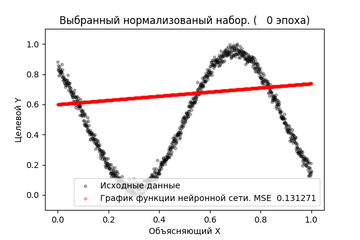|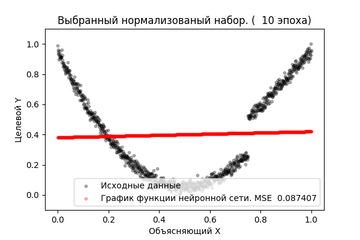|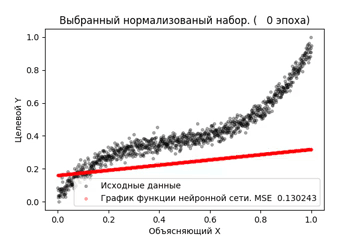|




Далее следует выполнить несколько циклов обучения (подстройки коэфф. каждого узла-нейрона) модели.

currEpochNum: 200/200


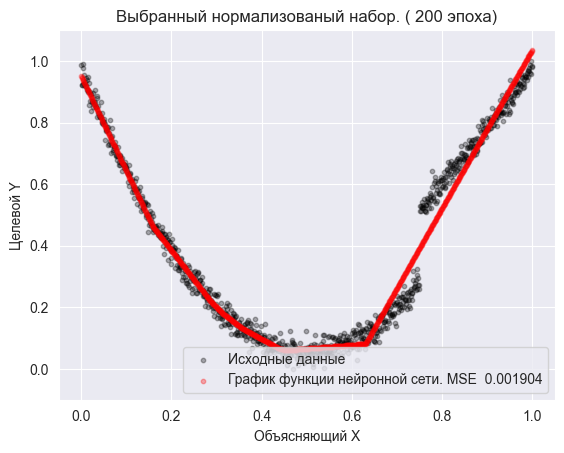

In [19]:
with tf.device('/CPU:0'):
    # В целях наглядной демонстрации количество эпох метода fit сокращено до "1", а значение batch_size увеличено до "100"
    epochForTrain = 200

    for currEpochNum in range(1, epochForTrain+1):

        # 3) Цикл обучения/продолжения обучения сети             
        # xNorm_train, xNorm_test, yNorm_train, yNorm_test 
        history = model.fit(
            xNorm_train,  # обучающие X
            yNorm_train,  # обучающие Y
            #validation_data=(xNorm_test, yNorm_test), # опционально проверочные X и Y
            epochs=1,   # кол-во эпох обучения
            batch_size=100, # кол-во образцов в каждой эпохе
            verbose=1,
        )

        # Только в условиях ЕДИНСТВЕННОГО x: Каждые N эпох выводить график текущей функции НС 
        if xNorm_train.shape[1] == 1: 
            if (currEpochNum) % 10 == 0:
                yNorm_pred = model.predict(xNorm_train)

                clear_output() # очистить окно вывода wait=False
                clear_output(wait=True) # очистить окно вывода
                print('currEpochNum: {}/{}'.format(currEpochNum, epochForTrain ))
                plt.figure()
                plt.scatter(xNorm_train, yNorm_train,  s=markerSize, color="black", alpha=transparencyVal, label =  "Исходные данные")
                plt.scatter(xNorm_train, yNorm_pred,   s=markerSize, color="red",   alpha=transparencyVal, label = f"График функции нейронной сети. MSE {history.history['loss'][-1]:>9.6f}")

                plt.title(f"Выбранный нормализованый набор. ({globalEpochCounter:>4} эпоха)")
                plt.ylabel("Целевой Y")
                plt.xlabel("Объясняющий X")
                plt.ylim( (-0.1, 1.1))
                plt.legend(loc='lower right')
                plt.pause(0.02) # временная пауза для отображения графика
                
        globalEpochCounter+=1

        # дополнение полной истории обучения 
        totalHistoryLossTrain.extend(history.history['loss'])
        if 'val_loss' in history.history.keys():
            totalHistoryLossTest.extend(history.history['val_loss'])

## Оценка точности

Text(0.5, 0, 'Эпохи обучения')

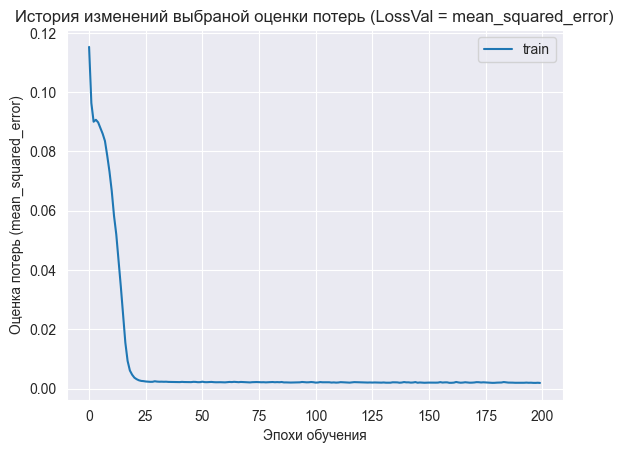

In [20]:
plt.plot(totalHistoryLossTrain, label='train')
if 'val_loss' in history.history.keys():
    plt.plot(totalHistoryLossTest, label='test')
plt.legend()
plt.title("История изменений выбраной оценки потерь (LossVal = mean_squared_error)")
plt.ylabel("Оценка потерь (mean_squared_error)")
plt.xlabel("Эпохи обучения")
###plt.ylim ( (0, 0.03) ) # область видимости для оси "Оценки потерь"

In [21]:
# Осмотрим последнии значения выбраной оценки потерь (LossVal = mean_squared_error)
totalHistoryLossTrain[-5:]

[0.0019801498856395483,
 0.001924783457070589,
 0.0019150280859321356,
 0.001960325986146927,
 0.0019041330087929964]

<font color='red'>
Внимание! Для сокращения кода обучение и оценка точности проводится на одном и том же наборе данных xNorm_train, что не отображает реальную обобщающее свойство модели. При выполнении основной части вам необходимо проводить оценку точности на проверочной части xNorm_test.
</font>

32/32 [==============================] - 0s 3ms/step
MAE :     0.032 (средняя абсолютная ошибка)
MSE :  0.001878 (среднеквадратичная ошибка)
RMSE:  0.043332 (кв. корень из среднеквадратичной ошибки)
R2  :     0.979 (коэфф. детерминации)


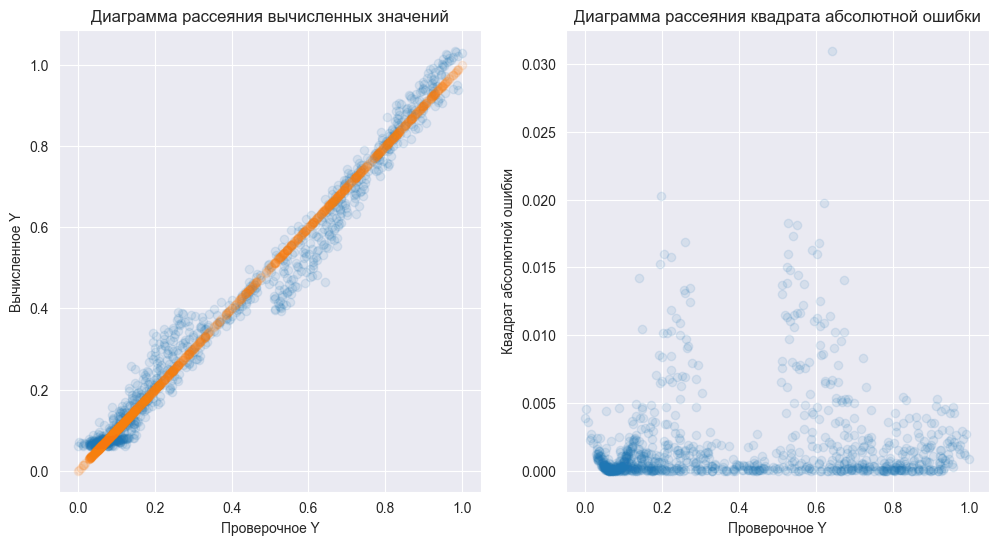

In [22]:
with tf.device('/CPU:0'):
    # Calculate predictions
    yNorm_pred = model.predict(xNorm_train)

GET_METRICS_SINGLE(yNorm_train, yNorm_pred)
PLOT34(yNorm_train, yNorm_pred)

# Загрузка данных

## Загрузка подготовленных данных
<b> Путь вида "./bike-sharing-dataset_nan_PREPARED.csv" подразумевает следующее расположение файлов:
```
WorkDir/
├─ datasets/
│  └─ melbourne_data_PREPARED.csv
│ 
├─ 3. ЛР-3.ipynb
```
</b> 

Для сохранения данных в ЛР-1,2 используйте команду
```
   data.to_csv('./путь/имя_файла.csv', index=False), где:
     './путь/имя_файла.csv' - абсолютный или относительный путь к новому файлу;
     index=False - значение параметра для исключения столбца с идентификаторами.
```

In [23]:
df = pd.read_csv('../datasets/bike-sharing-dataset_nan_PREPARED.csv', # путь к файлу, (используй автодотолнение)
                   sep=',', # разделитель данных в файле
                   header=0, # номер строки с заголовками, нумерация с нуля
                   # header='None', # если заголовки отсутствуют
                  )
print("Размер таблицы", df.shape)
df[:2]

Размер таблицы (16476, 15)


,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1.0,0.0,1.0,0.0,0.0,6.0,0.0,1.0,0.24,0.2879,0.81,0.0,3.0,13.0,16.0
1,1.0,0.0,1.0,1.0,0.0,6.0,0.0,1.0,0.22,0.2727,0.80,0.0,8.0,32.0,40.0


In [24]:
features = ['hr', 'temp', 'hum', 'weekday', 'season'] # исходные
target   = ['cnt'] # Целевая переменная

# Приведение к новой единой шкале. Нормализация

## Выделение X и Y

Для выполнения следующих шагов разделим исходую таблицу на две отдельных
  - dfX содержащую только объясняющие признаки
  - dfY содержащую только целевой объясняемый признак

In [25]:
dfX = df[features]
print("Размер таблицы", dfX.shape)
dfX[:2]

Размер таблицы (16476, 5)


,hr,temp,hum,weekday,season
0,0.0,0.24,0.81,6.0,1.0
1,1.0,0.22,0.80,6.0,1.0


In [26]:
dfY = df[target]
print("Размер таблицы", dfY.shape)
dfY[:2]

Размер таблицы (16476, 1)


,cnt
0,16.0
1,40.0


## Использование класса MinMaxScaler

В библиотеке sklearn, для выполнения процедуры нормализации, присутствует более удобный класс __sklearn.preprocessing.MinMaxScaler__, который содержит методы:

- __MinMaxScaler.fit(  df  )__ - вычисление значений __минимального__, __максимального значений__ и __диапазонна__ 

- __MinMaxScaler.transform( df )__ - прямого преобразования из истинного значения к приведенному

- __MinMaxScaler.inverse_transform( df )__ - обратного преобразования из приведенного значения в истинное

In [27]:
scalerNormX = MinMaxScaler()
scalerNormX.fit(dfX)

dfXNorm = pd.DataFrame (
  data    = scalerNormX.transform(dfX), # значения ячеек    <<--
  columns = dfX.columns,           # названия столбцов
  index   = dfX.index              # идентификаторы строк
)
print("Размер таблицы", dfXNorm.shape)
dfXNorm[:2]

Размер таблицы (16476, 5)


,hr,temp,hum,weekday,season
0,0.000000,0.224490,0.81,1.0,0.0
1,0.043478,0.204082,0.80,1.0,0.0


In [28]:
scalerNormY = MinMaxScaler()
scalerNormY.fit(dfY)

dfYNorm = pd.DataFrame (
  data    = scalerNormY.transform(dfY), # значения ячеек    <<--
  columns = dfY.columns,           # названия столбцов
  index   = dfY.index              # идентификаторы строк
)
print("Размер таблицы", dfYNorm.shape)
dfYNorm[:2]

Размер таблицы (16476, 1)


,cnt
0,0.024233
1,0.063005


## Проверка

In [39]:
dfXNorm.describe().loc[["min", "max" ]]

,hr,temp,hum,weekday,season
min,0.0,0.0,0.0,0.0,0.0
max,1.0,1.0,1.0,1.0,1.0


In [40]:
dfYNorm.describe().loc[["min", "max" ]]

,cnt
min,0.0
max,1.0


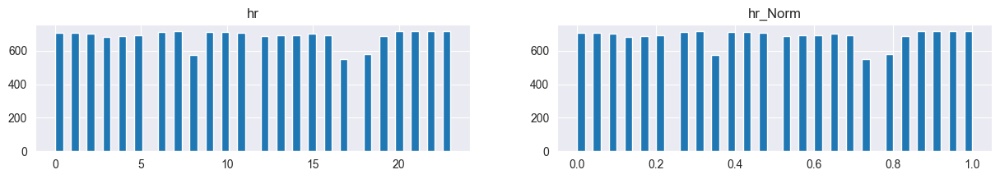

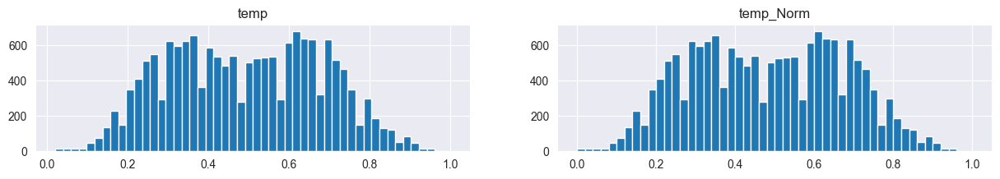

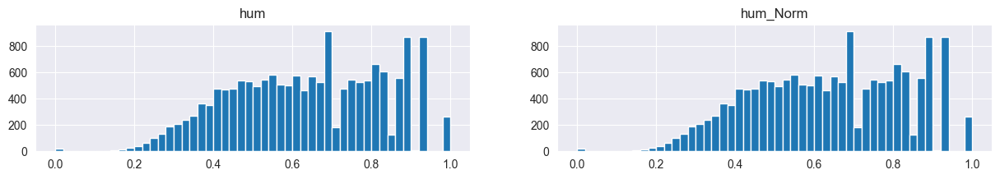

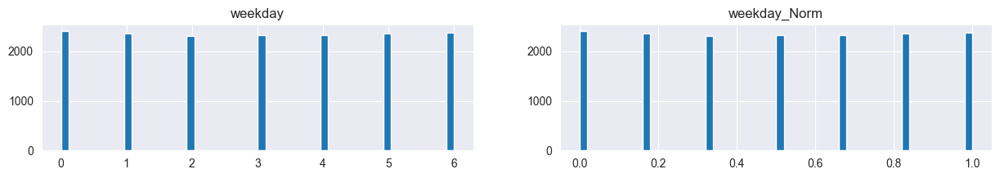

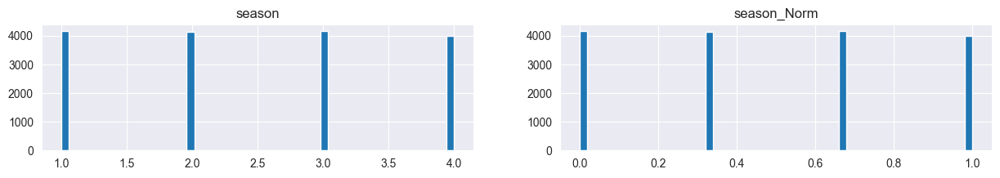

In [42]:
for i, colName in enumerate(dfXNorm.columns ):
    plt.figure(figsize=(15, 2))
    
    plt.subplot(1, 2, 1)
    plt.hist(df[colName], bins=50)
    plt.title(colName)
    
    plt.subplot(1, 2, 2)
    plt.hist(dfXNorm[colName], bins=50)
    plt.title(colName+"_Norm")

# Формирование тренировочной и проверочной выборок

In [43]:
valid_size = 0.3 # доля тестовой части в выборке
rand_seed = 8 # начальное состояние генератора случ. чисел

## Нормализованые

In [44]:
xNorm_train, xNorm_test, yNorm_train, yNorm_test =  train_test_split(
    dfXNorm[features], # исходные данные X
    dfYNorm[target],   # исходные данные y
    
    test_size    = valid_size, # доля тестовой части в выборке
    random_state =rand_seed,   # начальное состояние генератора случ. чисел
    shuffle=True               # перемешивание
) 

In [45]:
xNorm_train[:2]

,hr,temp,hum,weekday,season
16025,0.521739,0.326531,0.42,0.500000,1.000000
2543,0.913043,0.285714,0.93,0.833333,0.333333


In [46]:
yNorm_train[:2]

,cnt
16025,0.373183
2543,0.043619


# Нейронная сеть m1. Построение модели без скрытых слоев от ДВУХ "x" (2->1)

## Структура и параметры

In [47]:
with tf.device('/CPU:0'):
    
    totalHistoryLossTrain=[] # Вспомогательный список для хранение полной истории обучения
    totalHistoryLossTest=[]  # Вспомогательный список для хранение полной истории обучения
    
    ###########################################
    #▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼
    # 1) Параметры структуры
    input_size  = 2  # кол-во входных  узлов
    output_size = 1  # кол-во выходных узлов
    ###hiddenLayer_size  = 10 # кол-во узлов на скрытом слое

    # 2.1) Построение модели нейронной сети
    # Многослойная    
    model = tf.keras.models.Sequential()
    
    model.add(tf.keras.layers.Input(shape=(input_size,))) # Входной слой
    # параметр "units" - кол-во узлов/нейронов на данном слое
    # параметр "activation" - вид функции активации
    #...

    model.add(tf.keras.layers.Dense(units=output_size,  activation=tf.keras.activations.linear)) # Выходной слой, с линейной функцией активации
    
    
    # 2.2) Ф. потерь и оптимизации
    fLoss     =tf.keras.losses.mean_squared_error
    #fOptimizer=tf.keras.optimizers.SGD(learning_rate=0.01)
    fOptimizer=tf.keras.optimizers.Adam(learning_rate=0.01)
    fMetric  =[tf.keras.losses.mean_squared_error]
    
    model.compile(
        loss      =fLoss, 
        optimizer =fOptimizer, 
        metrics   =[ fMetric ]
    )   
    
    print(model.summary())
    #▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲
    ###########################################

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 1)                 3         
                                                                 
Total params: 3 (12.00 Byte)
Trainable params: 3 (12.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


## Первичное и дополнительное обучение 

In [48]:
# Получим используемые для обучения столбцы исходной таблицы
xNorm_train [["hr", "temp" ]].head(5) 

,hr,temp
16025,0.521739,0.326531
2543,0.913043,0.285714
16412,0.347826,0.244898
3863,0.130435,0.591837
11734,0.478261,0.653061


In [49]:
epochForTrain = 100

with tf.device('/CPU:0'):
    # 3) Цикл обучения/продолжения обучения сети             
    # xNorm_train, xNorm_test, yNorm_train, yNorm_test 
    history = model.fit(
        
        xNorm_train [["hr", "temp" ]],  # обучающие X  # требуется передать таблицу с кол-ом столбцов равным кол-ву входных нейронов
        yNorm_train,  # обучающие Y

        validation_data=(  # опционально: проверочные X и Y
            xNorm_test [["hr", "temp"]],  # требуется передать таблицу с кол-ом столбцов равным кол-ву входных нейронов
             yNorm_test), 

        epochs=epochForTrain,   # кол-во эпох обучения
        #batch_size=100, # кол-во образцов в каждой эпохе
        verbose=1,
    )
    
    totalHistoryLossTrain.extend(history.history['loss'])
    if 'val_loss' in history.history.keys():
        totalHistoryLossTest.extend(history.history['val_loss'])

Epoch 1/100
361/361 [==============================] - 3s 6ms/step - loss: 0.0869 - mean_squared_error: 0.0869 - val_loss: 0.0454 - val_mean_squared_error: 0.0454
Epoch 2/100
361/361 [==============================] - 2s 5ms/step - loss: 0.0437 - mean_squared_error: 0.0437 - val_loss: 0.0417 - val_mean_squared_error: 0.0417
Epoch 3/100
361/361 [==============================] - 2s 5ms/step - loss: 0.0426 - mean_squared_error: 0.0426 - val_loss: 0.0416 - val_mean_squared_error: 0.0416
Epoch 4/100
361/361 [==============================] - 1s 4ms/step - loss: 0.0427 - mean_squared_error: 0.0427 - val_loss: 0.0417 - val_mean_squared_error: 0.0417
Epoch 5/100
361/361 [==============================] - 2s 5ms/step - loss: 0.0425 - mean_squared_error: 0.0425 - val_loss: 0.0417 - val_mean_squared_error: 0.0417
Epoch 6/100
361/361 [==============================] - 2s 4ms/step - loss: 0.0427 - mean_squared_error: 0.0427 - val_loss: 0.0424 - val_mean_squared_error: 0.0424
Epoch 7/100
361/361 [=

In [50]:
history.history.keys()

dict_keys(['loss', 'mean_squared_error', 'val_loss', 'val_mean_squared_error'])

## Оценка точности

Text(0.5, 0, 'Эпохи обучения')

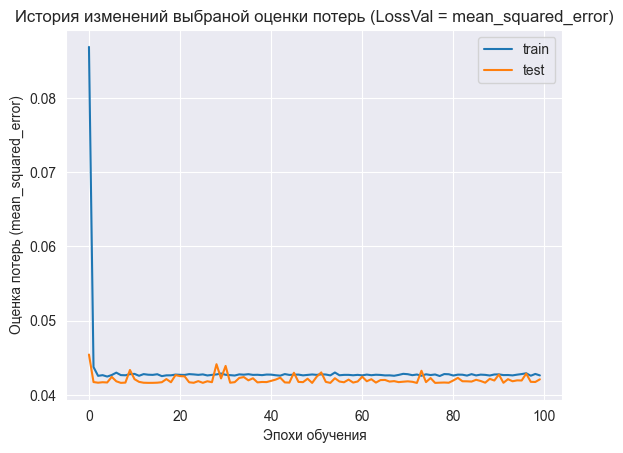

In [51]:
plt.plot(totalHistoryLossTrain, label='train')
if 'val_loss' in history.history.keys():
    plt.plot(totalHistoryLossTest, label='test')
plt.legend()
plt.title("История изменений выбраной оценки потерь (LossVal = mean_squared_error)")
plt.ylabel("Оценка потерь (mean_squared_error)")
plt.xlabel("Эпохи обучения")
###plt.ylim ( (0, 0.03) ) # область видимости для оси "Оценки потерь"

In [52]:
# Осмотрим последнии значения выбраной оценки потерь (LossVal = mean_squared_error)
totalHistoryLossTrain[-5:]

[0.0428035631775856,
 0.04291195049881935,
 0.042579177767038345,
 0.04282226786017418,
 0.042624253779649734]

155/155 [==============================] - 1s 4ms/step
MAE :     0.162 (средняя абсолютная ошибка)
MSE :  0.042098 (среднеквадратичная ошибка)
RMSE:  0.205177 (кв. корень из среднеквадратичной ошибки)
R2  :     0.291 (коэфф. детерминации)


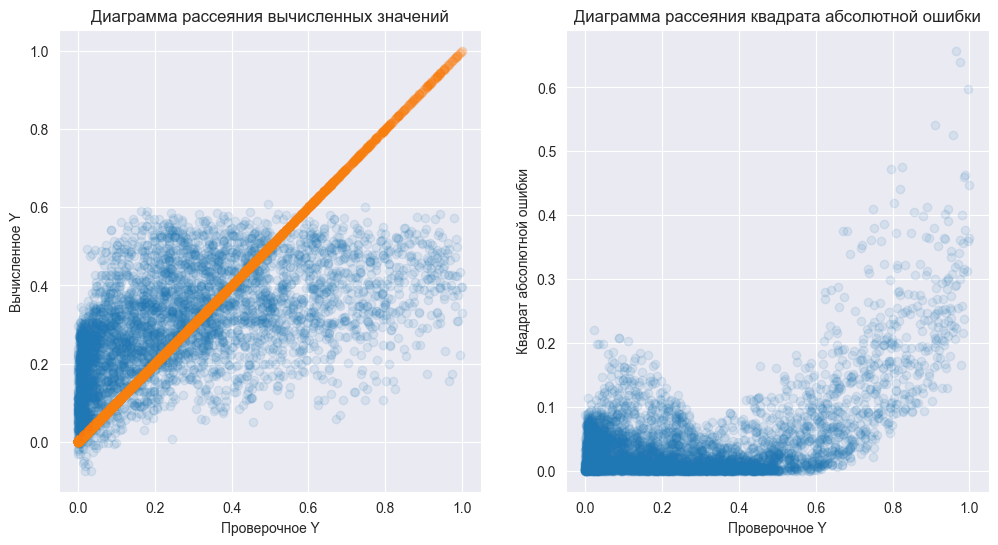

In [53]:
# create model
with tf.device('/CPU:0'):
    # Calculate predictions
    yNorm_pred = model.predict( xNorm_test [["hr", "temp"]] ) # требуется передать таблицу с кол-ом столбцов равным кол-ву входных нейронов

GET_METRICS_SINGLE(yNorm_test, yNorm_pred)
PLOT34(yNorm_test, yNorm_pred)

## Получение весовых коэфф. w_i и bias для модели m1 (2->1)

In [54]:
# Осмотр весовых коэфф.  
for layer in model.layers:
  print(f"\nИмя слоя:{layer.name};  Тип слоя: {layer} ------------------------------------")
  print(f"\nВесовые коэфф. w_i  ") 
  print(layer.weights[0].numpy())
  print(f"\nВесовой коэфф. bias {layer.bias.numpy()}")


Имя слоя:dense_3;  Тип слоя: <keras.src.layers.core.dense.Dense object at 0x000001DDBE774EB0> ------------------------------------

Весовые коэфф. w_i  
[[0.29992598]
 [0.46871218]]

Весовой коэфф. bias [-0.0829671]


## Построение 3d графика зависимости вычисленных значений Y_pred от объясняющих признаков x1 и x2

In [55]:
my3dplot(
    xNorm_train, yNorm_train,  not True,
    xNorm_test,  yNorm_test,   True, 
    yNorm_pred,                True, 
    "hr", "temp", *target)

# Нейронная сеть m2. Построение модели со скрытыми слоями от ДВУХ "x" (2->30->20->1)

In [56]:
with tf.device('/CPU:0'):
    
    totalHistoryLossTrain=[] # Вспомогательный список для хранение полной истории обучения
    totalHistoryLossTest=[]  # Вспомогательный список для хранение полной истории обучения
    
    ###########################################
    #▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼
    # 1) Параметры структуры
    input_size  = 2  # кол-во входных  узлов
    output_size = 1  # кол-во выходных узлов
    hiddenLayer_size1  = 30 # кол-во узлов на 1 скрытом слое
    hiddenLayer_size2  = 20 # кол-во узлов на 2 скрытом слое
    # 2.1) Построение модели нейронной сети
    # Многослойная    
    model = tf.keras.models.Sequential()
    
    model.add(tf.keras.layers.Input(shape=(input_size,))) # Входной слой
    # параметр "units" - кол-во узлов/нейронов на данном слое
    # параметр "activation" - вид функции активации
    #...
    model.add(tf.keras.layers.Dense(units=hiddenLayer_size1,  activation=tf.keras.activations.sigmoid))
    model.add(tf.keras.layers.Dense(units=hiddenLayer_size2,  activation=tf.keras.activations.elu))
    model.add(tf.keras.layers.Dense(units=output_size,  activation=tf.keras.activations.linear)) # Выходной слой, с линейной функцией активации
    
    
    # 2.2) Ф. потерь и оптимизации
    fLoss     =tf.keras.losses.mean_squared_error
    #fOptimizer=tf.keras.optimizers.SGD(learning_rate=0.01)
    fOptimizer=tf.keras.optimizers.Adam(learning_rate=0.01)
    fMetric  =[tf.keras.losses.mean_squared_error]
    
    model.compile(
        loss      =fLoss, 
        optimizer =fOptimizer, 
        metrics   =[ fMetric ]
    )   
    
    print(model.summary())
    #▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲
    ###########################################

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 30)                90        
                                                                 
 dense_5 (Dense)             (None, 20)                620       
                                                                 
 dense_6 (Dense)             (None, 1)                 21        
                                                                 
Total params: 731 (2.86 KB)
Trainable params: 731 (2.86 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


## Первичное и дополнительное обучение 


In [57]:
# Получим используемые для обучения столбцы исходной таблицы
xNorm_train [["hr", "temp", ]].head(5) 

,hr,temp
16025,0.521739,0.326531
2543,0.913043,0.285714
16412,0.347826,0.244898
3863,0.130435,0.591837
11734,0.478261,0.653061


In [58]:
epochForTrain = 1000

with tf.device('/CPU:0'):
    # 3) Цикл обучения/продолжения обучения сети             
    # xNorm_train, xNorm_test, yNorm_train, yNorm_test 
    history = model.fit(
        
        xNorm_train [["hr", "temp"]],  # обучающие X  # требуется передать таблицу с кол-ом столбцов равным кол-ву входных нейронов
        yNorm_train,  # обучающие Y

        validation_data=(  # опционально: проверочные X и Y
            xNorm_test [["hr", "temp"]],  # требуется передать таблицу с кол-ом столбцов равным кол-ву входных нейронов
             yNorm_test), 

        epochs=epochForTrain,   # кол-во эпох обучения
        #batch_size=100, # кол-во образцов в каждой эпохе
        verbose=1,
    )
    
    totalHistoryLossTrain.extend(history.history['loss'])
    if 'val_loss' in history.history.keys():
        totalHistoryLossTest.extend(history.history['val_loss'])

Epoch 1/1000
361/361 [==============================] - 11s 14ms/step - loss: 0.0527 - mean_squared_error: 0.0527 - val_loss: 0.0708 - val_mean_squared_error: 0.0708
Epoch 2/1000
361/361 [==============================] - 5s 13ms/step - loss: 0.0449 - mean_squared_error: 0.0449 - val_loss: 0.0409 - val_mean_squared_error: 0.0409
Epoch 3/1000
361/361 [==============================] - 3s 7ms/step - loss: 0.0430 - mean_squared_error: 0.0430 - val_loss: 0.0467 - val_mean_squared_error: 0.0467
Epoch 4/1000
361/361 [==============================] - 2s 4ms/step - loss: 0.0395 - mean_squared_error: 0.0395 - val_loss: 0.0339 - val_mean_squared_error: 0.0339
Epoch 5/1000
361/361 [==============================] - 2s 4ms/step - loss: 0.0344 - mean_squared_error: 0.0344 - val_loss: 0.0385 - val_mean_squared_error: 0.0385
Epoch 6/1000
361/361 [==============================] - 2s 5ms/step - loss: 0.0339 - mean_squared_error: 0.0339 - val_loss: 0.0312 - val_mean_squared_error: 0.0312
Epoch 7/1000


In [59]:
history.history.keys()

dict_keys(['loss', 'mean_squared_error', 'val_loss', 'val_mean_squared_error'])

## Оценка точности

Text(0.5, 0, 'Эпохи обучения')

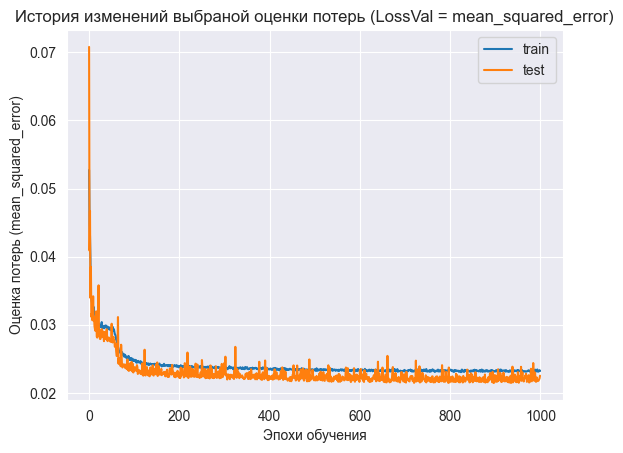

In [60]:
plt.plot(totalHistoryLossTrain, label='train')
if 'val_loss' in history.history.keys():
    plt.plot(totalHistoryLossTest, label='test')
plt.legend()
plt.title("История изменений выбраной оценки потерь (LossVal = mean_squared_error)")
plt.ylabel("Оценка потерь (mean_squared_error)")
plt.xlabel("Эпохи обучения")
###plt.ylim ( (0, 0.03) ) # область видимости для оси "Оценки потерь"

In [61]:
# Осмотрим последнии значения выбраной оценки потерь (LossVal = mean_squared_error)
totalHistoryLossTrain[-5:]

[0.02322717383503914,
 0.02314240112900734,
 0.023191478103399277,
 0.023328831419348717,
 0.023213062435388565]

155/155 [==============================] - 1s 3ms/step
MAE :     0.108 (средняя абсолютная ошибка)
MSE :  0.022520 (среднеквадратичная ошибка)
RMSE:  0.150067 (кв. корень из среднеквадратичной ошибки)
R2  :     0.621 (коэфф. детерминации)


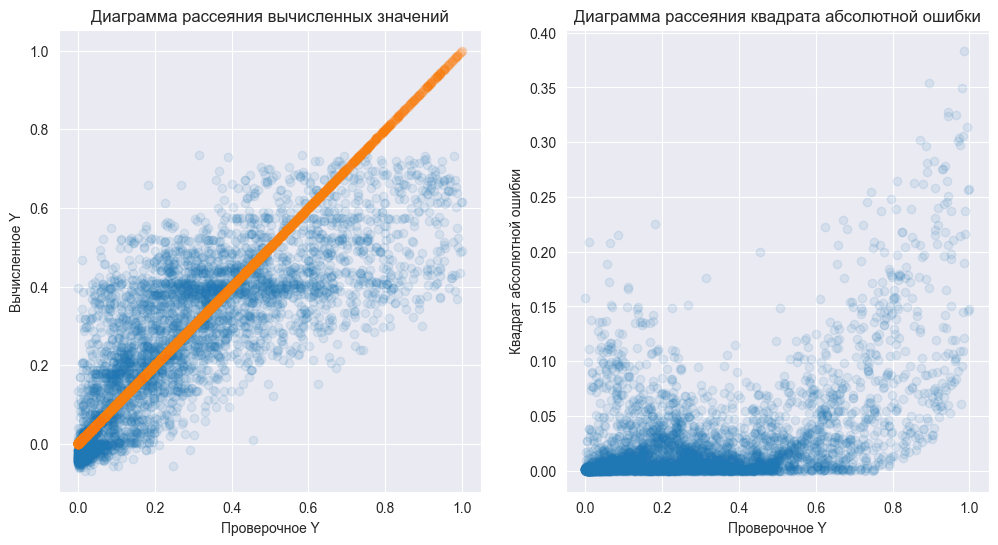

In [62]:
# create model
with tf.device('/CPU:0'):
    # Calculate predictions
    yNorm_pred = model.predict( xNorm_test [["hr", "temp"]] ) # требуется передать таблицу с кол-ом столбцов равным кол-ву входных нейронов

GET_METRICS_SINGLE(yNorm_test, yNorm_pred)
PLOT34(yNorm_test, yNorm_pred)

## Получение весовых коэфф. w_i и bias для модели m2 (2->30->20->1)

In [63]:
# Осмотр весовых коэфф.  
for layer in model.layers:
  print(f"\nИмя слоя:{layer.name};  Тип слоя: {layer} ------------------------------------")
  print(f"\nВесовые коэфф. w_i  ") 
  print(layer.weights[0].numpy())
  print(f"\nВесовой коэфф. bias {layer.bias.numpy()}")


Имя слоя:dense_4;  Тип слоя: <keras.src.layers.core.dense.Dense object at 0x000001DDB9B16460> ------------------------------------

Весовые коэфф. w_i  
[[-10.777868   -24.560846    -5.2280316   -5.332827   -16.70982
   13.642087   -20.422115    -8.36623     -6.9998827   -5.538327
   -0.79102457  -1.95109     -8.949609     9.96985     -1.7690752
   -5.3830533   -5.097043   -23.53358     -2.478118    -4.525213
   -5.2952714  -13.994155   -11.131705    -6.3389435   -3.9535596
   -5.9017324  -13.869775    -5.2958193    1.0650151    7.516875  ]
 [ -3.6015308   -2.23717     -6.7726436   -5.975268     3.174243
   -0.6747018    5.014047    -3.774952    -3.91789     -7.2560334
   -3.7033389   -4.4785414   -2.031419    -7.4782887   -4.6593003
   -8.378388    -6.372418     0.8133386   -9.884531    -5.9621487
   -5.874135   -17.169523    -3.4067042   -6.7979665   -5.671176
   -7.623714    -3.438689    -6.6179304   -5.7300324  -16.60664   ]]

Весовой коэфф. bias [-10.559739     8.773687    -7.753

## Построение 3d графика зависимости вычисленных значений Y_pred от объясняющих признаков x1 и x2

In [64]:
my3dplot(
    xNorm_train, yNorm_train,  not True,
    xNorm_test,  yNorm_test,   True, 
    yNorm_pred,                True, 
    "hr", "temp", *target)

# Нейронная сеть m3. Построение модели без скрытых слоев от множества "x" (пример 5->1)

In [65]:
with tf.device('/CPU:0'):
    
    totalHistoryLossTrain=[] # Вспомогательный список для хранение полной истории обучения
    totalHistoryLossTest=[]  # Вспомогательный список для хранение полной истории обучения
    
    ###########################################
    #▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼
    # 1) Параметры структуры
    input_size  = 5  # кол-во входных  узлов
    output_size = 1  # кол-во выходных узлов
    ###hiddenLayer_size  = 10 # кол-во узлов на скрытом слое

    # 2.1) Построение модели нейронной сети
    # Многослойная    
    model = tf.keras.models.Sequential()
    
    model.add(tf.keras.layers.Input(shape=(input_size,))) # Входной слой
    # параметр "units" - кол-во узлов/нейронов на данном слое
    # параметр "activation" - вид функции активации
    #...

    model.add(tf.keras.layers.Dense(units=output_size,  activation=tf.keras.activations.linear)) # Выходной слой, с линейной функцией активации
    
    
    # 2.2) Ф. потерь и оптимизации
    fLoss     =tf.keras.losses.mean_squared_error
    #fOptimizer=tf.keras.optimizers.SGD(learning_rate=0.01)
    fOptimizer=tf.keras.optimizers.Adam(learning_rate=0.01)
    fMetric  =[tf.keras.losses.mean_squared_error]
    
    model.compile(
        loss      =fLoss, 
        optimizer =fOptimizer, 
        metrics   =[ fMetric ]
    )   
    
    print(model.summary())
    #▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲
    ###########################################

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_7 (Dense)             (None, 1)                 6         
                                                                 
Total params: 6 (24.00 Byte)
Trainable params: 6 (24.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


## Первичное и дополнительное обучение 

In [66]:
xNorm_train [['hr', 'temp', 'hum', 'weekday', 'season' ]].head(5)

,hr,temp,hum,weekday,season
16025,0.521739,0.326531,0.42,0.500000,1.000000
2543,0.913043,0.285714,0.93,0.833333,0.333333
16412,0.347826,0.244898,0.81,1.000000,0.000000
3863,0.130435,0.591837,0.88,1.000000,0.333333
11734,0.478261,0.653061,0.65,0.666667,0.333333


In [67]:
epochForTrain = 250

with tf.device('/CPU:0'):
    # 3) Цикл обучения/продолжения обучения сети             
    # xNorm_train, xNorm_test, yNorm_train, yNorm_test 
    history = model.fit(
        
        xNorm_train [['hr', 'temp', 'hum', 'weekday', 'season']],  # обучающие X  # требуется передать таблицу с кол-ом столбцов равным кол-ву входных нейронов
        yNorm_train,  # обучающие Y

        validation_data=(  # опционально: проверочные X и Y
            xNorm_test [['hr', 'temp', 'hum', 'weekday', 'season']],  # требуется передать таблицу с кол-ом столбцов равным кол-ву входных нейронов
             yNorm_test), 

        epochs=epochForTrain,   # кол-во эпох обучения
        #batch_size=100, # кол-во образцов в каждой эпохе
        verbose=1,
    )
    
    totalHistoryLossTrain.extend(history.history['loss'])
    if 'val_loss' in history.history.keys():
        totalHistoryLossTest.extend(history.history['val_loss'])

Epoch 1/250
361/361 [==============================] - 3s 6ms/step - loss: 0.0928 - mean_squared_error: 0.0928 - val_loss: 0.0404 - val_mean_squared_error: 0.0404
Epoch 2/250
361/361 [==============================] - 1s 3ms/step - loss: 0.0400 - mean_squared_error: 0.0400 - val_loss: 0.0387 - val_mean_squared_error: 0.0387
Epoch 3/250
361/361 [==============================] - 1s 3ms/step - loss: 0.0393 - mean_squared_error: 0.0393 - val_loss: 0.0387 - val_mean_squared_error: 0.0387
Epoch 4/250
361/361 [==============================] - 1s 3ms/step - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0390 - val_mean_squared_error: 0.0390
Epoch 5/250
361/361 [==============================] - 1s 3ms/step - loss: 0.0393 - mean_squared_error: 0.0393 - val_loss: 0.0386 - val_mean_squared_error: 0.0386
Epoch 6/250
361/361 [==============================] - 1s 3ms/step - loss: 0.0393 - mean_squared_error: 0.0393 - val_loss: 0.0389 - val_mean_squared_error: 0.0389
Epoch 7/250
361/361 [=

In [68]:
history.history.keys()

dict_keys(['loss', 'mean_squared_error', 'val_loss', 'val_mean_squared_error'])

## Оценка точности

Text(0.5, 0, 'Эпохи обучения')

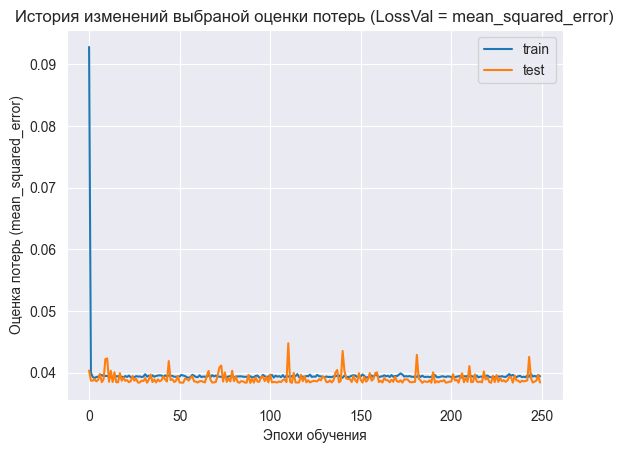

In [69]:
plt.plot(totalHistoryLossTrain, label='train')
if 'val_loss' in history.history.keys():
    plt.plot(totalHistoryLossTest, label='test')
plt.legend()
plt.title("История изменений выбраной оценки потерь (LossVal = mean_squared_error)")
plt.ylabel("Оценка потерь (mean_squared_error)")
plt.xlabel("Эпохи обучения")
###plt.ylim ( (0, 0.03) ) # область видимости для оси "Оценки потерь"

In [70]:
# Осмотрим последнии значения выбраной оценки потерь (LossVal = mean_squared_error)
totalHistoryLossTrain[-5:]

[0.0393822006881237,
 0.03950145095586777,
 0.039370905607938766,
 0.03962573781609535,
 0.039429694414138794]

155/155 [==============================] - 0s 2ms/step
MAE :     0.151 (средняя абсолютная ошибка)
MSE :  0.038425 (среднеквадратичная ошибка)
RMSE:  0.196022 (кв. корень из среднеквадратичной ошибки)
R2  :     0.353 (коэфф. детерминации)


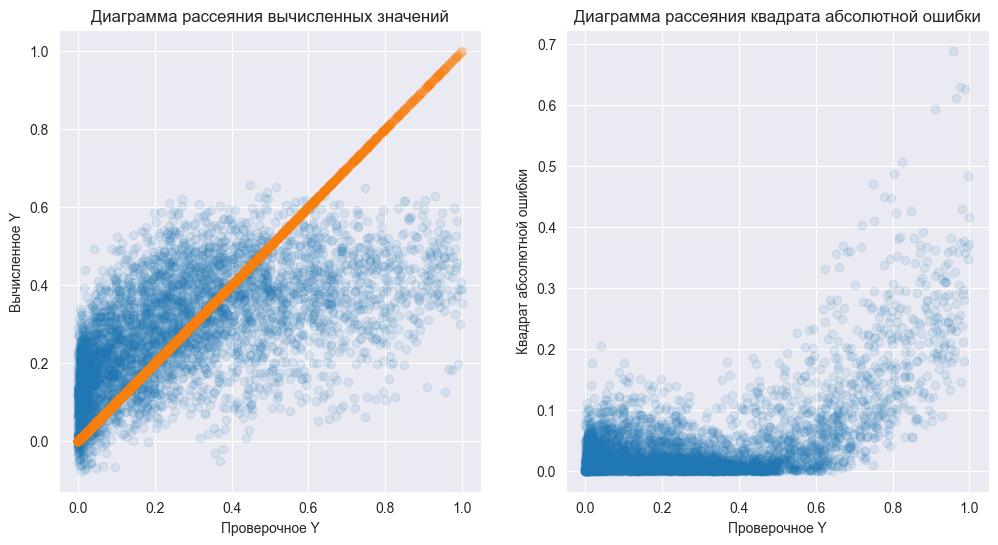

In [71]:
# create model
with tf.device('/CPU:0'):
    # Calculate predictions
    yNorm_pred = model.predict( xNorm_test [['hr', 'temp', 'hum', 'weekday', 'season']] ) # требуется передать таблицу с кол-ом столбцов равным кол-ву входных нейронов

GET_METRICS_SINGLE(yNorm_test, yNorm_pred)
PLOT34(yNorm_test, yNorm_pred)

## Получение весовых коэфф. w_i и bias для модели m3 (5->1)

In [72]:
# Осмотр весовых коэфф.  
for layer in model.layers:
  print(f"\nИмя слоя:{layer.name};  Тип слоя: {layer} ------------------------------------")
  print(f"\nВесовые коэфф. w_i  ") 
  print(layer.weights[0].numpy())
  print(f"\nВесовой коэфф. bias {layer.bias.numpy()}")


Имя слоя:dense_7;  Тип слоя: <keras.src.layers.core.dense.Dense object at 0x000001DDC8C92EE0> ------------------------------------

Весовые коэфф. w_i  
[[ 0.24120122]
 [ 0.39116403]
 [-0.3058944 ]
 [ 0.01941783]
 [ 0.07807149]]

Весовой коэфф. bias [0.11150959]


# Нейронная сеть m4. Построение модели со скрытыми слоями от множества "x"  (пример: 5->30->20->1)

In [73]:
with tf.device('/CPU:0'):
    
    totalHistoryLossTrain=[] # Вспомогательный список для хранение полной истории обучения
    totalHistoryLossTest=[]  # Вспомогательный список для хранение полной истории обучения
    
    ###########################################
    #▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼
    # 1) Параметры структуры
    input_size  = 5  # кол-во входных  узлов
    output_size = 1  # кол-во выходных узлов
    hiddenLayer_size1  = 30 # кол-во узлов на 1 скрытом слое
    hiddenLayer_size2  = 20 # кол-во узлов на 2 скрытом слое
    # 2.1) Построение модели нейронной сети
    # Многослойная    
    model = tf.keras.models.Sequential()
    
    model.add(tf.keras.layers.Input(shape=(input_size,))) # Входной слой
    # параметр "units" - кол-во узлов/нейронов на данном слое
    # параметр "activation" - вид функции активации
    #...
    
    model.add(tf.keras.layers.Dense(units=hiddenLayer_size1,  activation=tf.keras.activations.linear))
    model.add(tf.keras.layers.Dense(units=hiddenLayer_size2,  activation=tf.keras.activations.sigmoid))
   
    model.add(tf.keras.layers.Dense(units=output_size,  activation=tf.keras.activations.linear)) # Выходной слой, с линейной функцией активации
    
    
    # 2.2) Ф. потерь и оптимизации
    fLoss     =tf.keras.losses.mean_squared_error
    #fOptimizer=tf.keras.optimizers.SGD(learning_rate=0.01)
    fOptimizer=tf.keras.optimizers.Adam(learning_rate=0.01)
    fMetric  =[tf.keras.losses.mean_squared_error]
    
    model.compile(
        loss      =fLoss, 
        optimizer =fOptimizer, 
        metrics   =[ fMetric ]
    )   
    
    print(model.summary())
    #▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲
    ###########################################

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 30)                180       
                                                                 
 dense_9 (Dense)             (None, 20)                620       
                                                                 
 dense_10 (Dense)            (None, 1)                 21        
                                                                 
Total params: 821 (3.21 KB)
Trainable params: 821 (3.21 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


## Первичное и дополнительное обучение 

In [74]:
# Получим используемые для обучения столбцы исходной таблицы
xNorm_train [['hr', 'temp', 'hum', 'weekday', 'season' ]].head(5) 

,hr,temp,hum,weekday,season
16025,0.521739,0.326531,0.42,0.500000,1.000000
2543,0.913043,0.285714,0.93,0.833333,0.333333
16412,0.347826,0.244898,0.81,1.000000,0.000000
3863,0.130435,0.591837,0.88,1.000000,0.333333
11734,0.478261,0.653061,0.65,0.666667,0.333333


In [75]:
epochForTrain = 250

with tf.device('/CPU:0'):
    # 3) Цикл обучения/продолжения обучения сети             
    # xNorm_train, xNorm_test, yNorm_train, yNorm_test 
    history = model.fit(
        
        xNorm_train [['hr', 'temp', 'hum', 'weekday', 'season']],  # обучающие X  # требуется передать таблицу с кол-ом столбцов равным кол-ву входных нейронов
        yNorm_train,  # обучающие Y

        validation_data=(  # опционально: проверочные X и Y
            xNorm_test [['hr', 'temp', 'hum', 'weekday', 'season']],  # требуется передать таблицу с кол-ом столбцов равным кол-ву входных нейронов
             yNorm_test), 

        epochs=epochForTrain,   # кол-во эпох обучения
        #batch_size=100, # кол-во образцов в каждой эпохе
        verbose=1,
    )
    
    totalHistoryLossTrain.extend(history.history['loss'])
    if 'val_loss' in history.history.keys():
        totalHistoryLossTest.extend(history.history['val_loss'])

Epoch 1/250
361/361 [==============================] - 3s 5ms/step - loss: 0.0403 - mean_squared_error: 0.0403 - val_loss: 0.0313 - val_mean_squared_error: 0.0313
Epoch 2/250
361/361 [==============================] - 1s 4ms/step - loss: 0.0325 - mean_squared_error: 0.0325 - val_loss: 0.0302 - val_mean_squared_error: 0.0302
Epoch 3/250
361/361 [==============================] - 1s 4ms/step - loss: 0.0315 - mean_squared_error: 0.0315 - val_loss: 0.0309 - val_mean_squared_error: 0.0309
Epoch 4/250
361/361 [==============================] - 2s 4ms/step - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0287 - val_mean_squared_error: 0.0287
Epoch 5/250
361/361 [==============================] - 1s 3ms/step - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0312 - val_mean_squared_error: 0.0312
Epoch 6/250
361/361 [==============================] - 1s 4ms/step - loss: 0.0304 - mean_squared_error: 0.0304 - val_loss: 0.0282 - val_mean_squared_error: 0.0282
Epoch 7/250
361/361 [=

In [76]:
history.history.keys()

dict_keys(['loss', 'mean_squared_error', 'val_loss', 'val_mean_squared_error'])

## Оценка точности

Text(0.5, 0, 'Эпохи обучения')

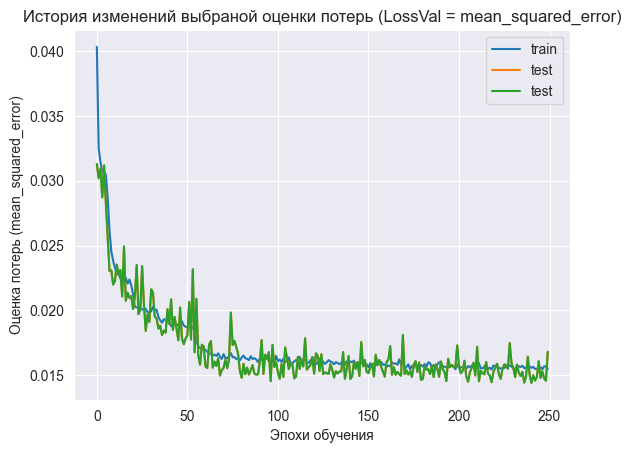

In [77]:
plt.plot(totalHistoryLossTrain, label='train')
if 'val_loss' in history.history.keys():
    plt.plot(totalHistoryLossTest, label='test')
plt.legend()
plt.title("История изменений выбраной оценки потерь (LossVal = mean_squared_error)")
plt.ylabel("Оценка потерь (mean_squared_error)")
plt.xlabel("Эпохи обучения")
###plt.ylim ( (0, 0.03) ) # область видимости для оси "Оценки потерь"plt.plot(totalHistoryLossTrain, label='train')
if 'val_loss' in history.history.keys():
    plt.plot(totalHistoryLossTest, label='test')
plt.legend()
plt.title("История изменений выбраной оценки потерь (LossVal = mean_squared_error)")
plt.ylabel("Оценка потерь (mean_squared_error)")
plt.xlabel("Эпохи обучения")
###plt.ylim ( (0, 0.03) ) # область видимости для оси "Оценки потерь"

In [78]:
# Осмотрим последнии значения выбраной оценки потерь (LossVal = mean_squared_error)
totalHistoryLossTrain[-5:]

[0.015636831521987915,
 0.015471912920475006,
 0.015691328793764114,
 0.015687134116888046,
 0.015501327812671661]

155/155 [==============================] - 0s 2ms/step
MAE :     0.101 (средняя абсолютная ошибка)
MSE :  0.016812 (среднеквадратичная ошибка)
RMSE:  0.129662 (кв. корень из среднеквадратичной ошибки)
R2  :     0.717 (коэфф. детерминации)


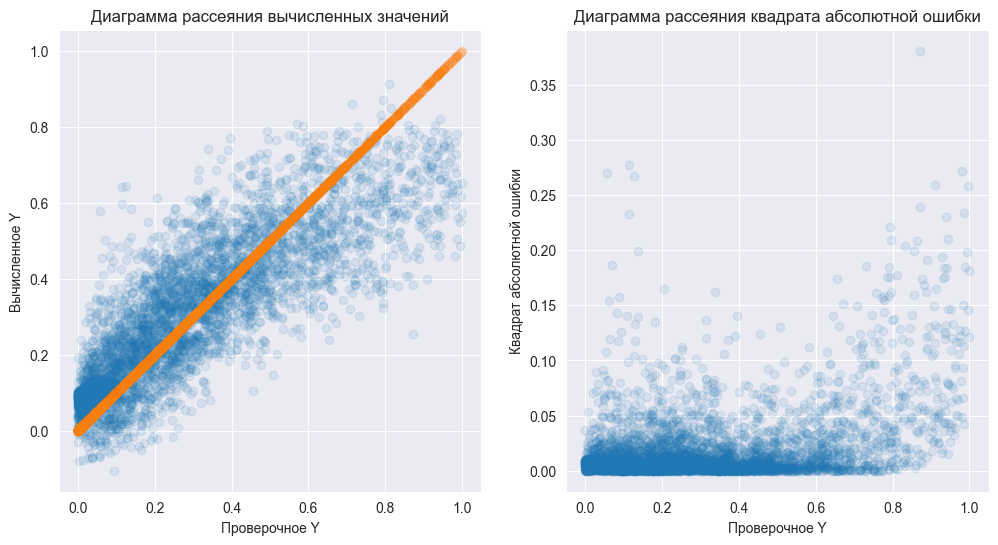

In [79]:
# create model
with tf.device('/CPU:0'):
    # Calculate predictions
    yNorm_pred = model.predict( xNorm_test [['hr', 'temp', 'hum', 'weekday', 'season']] ) # требуется передать таблицу с кол-ом столбцов равным кол-ву входных нейронов

GET_METRICS_SINGLE(yNorm_test, yNorm_pred)
PLOT34(yNorm_test, yNorm_pred)

## Получение весовых коэфф. w_i и bias для модели m4 (5->30->20->1)

In [80]:
# Осмотр весовых коэфф.  
for layer in model.layers:
  print(f"\nИмя слоя:{layer.name};  Тип слоя: {layer} ------------------------------------")
  print(f"\nВесовые коэфф. w_i  ") 
  print(layer.weights[0].numpy())
  print(f"\nВесовой коэфф. bias {layer.bias.numpy()}")


Имя слоя:dense_8;  Тип слоя: <keras.src.layers.core.dense.Dense object at 0x000001DDCAEABBB0> ------------------------------------

Весовые коэфф. w_i  
[[-1.22543518e-02 -7.32982391e-03  4.71467376e-02 -9.93247479e-02
   5.20361541e-03 -8.56529735e-03  4.25897352e-03 -2.75587179e-02
   2.60512773e-02  3.52844484e-02  3.01519918e+00 -1.04456255e-02
  -1.94517180e-01  1.06161162e-02  2.47579980e+00  2.72139645e+00
   3.28433402e-02  2.38800693e+00 -3.83289419e-02 -2.22711042e-02
  -1.07516386e-02  2.84612328e-02  2.65745330e+00  1.58615801e-02
   3.08420807e-02  1.33739575e-03  9.35375132e-03 -1.95537880e-02
   6.11804247e+00  2.60252897e-02]
 [ 1.96483061e-02 -1.83786862e-02 -3.22248340e-02 -2.46328324e-01
  -1.96108501e-02 -6.74521644e-03 -3.03689018e-02 -1.00129433e-02
  -4.50189365e-03 -2.13168170e-02 -2.00615358e+00  1.02283480e-02
  -1.15182912e+00 -4.78043500e-03  2.61300802e+00 -2.57220268e-01
  -3.55790034e-02 -1.23668904e-03  2.87342654e-03  1.86056979e-02
  -2.93113664e-02  

# Сравнение полученных моделей

In [81]:
ddf = pd.DataFrame (
    [
        ["hr and temp",     "2->1",          100, 0.298, 0.204144],
        ["hr and temp",  "2->30->20->1",1000, 0.631,  0.148107],
        ["all",    "5->1",          250, 0.329,  0.199616],
        ["all",    "5->30->20->1",250, 0.755,  0.120573],
    ],
    columns= ["Признаки", "Структура", "ЭпохОбучения", "R2", "RMSE" ],
 )
ddf

,Признаки,Структура,ЭпохОбучения,R2,RMSE
0,hr and temp,2->1,100,0.298,0.204144
1,hr and temp,2->30->20->1,1000,0.631,0.148107
2,all,5->1,250,0.329,0.199616
3,all,5->30->20->1,250,0.755,0.120573


# Выводы по работе

В ходе лабораторной работы было проведено обучение нейронной сети и её последующее тестирование со скрытыми слоями и без. Также была изменена структура: сначала 2 входных и один выходной со скрытыми слоями и без. В результате мы получили низкое значение R2, что говорит о том, что данная нейронная сеть очень плохо обучается на заданных данных. В следущих двух нейронных системах мы сделали уже 5 входных нейронов, что значительно увеличило коэффициент детерминации. После добавления скрытых слоёв(с неленейными функциями активации),это значительно увеличило ррезультаты, из чего мы можем сделать вывод, что наша зависимость нелинейна. Также значение R2 не поднималось выше 
0.755, что говорит нам о том, что это значение является максимальным для наших данных, это выше чем в первой лабораторной где максимальным значением R2 было 0.303987, чтобы увеличить это значение, далее необходимо обрабатывать данные другим образом. 